<a href="https://colab.research.google.com/github/jusgowiturs/Shared-Task---Speech-Recognition/blob/main/Speech_Recognition_Shared_Task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Shared Task of Speech Recognition


<p>This shared task consist of 36 tamil audio files and 36 tamil transcript files. The task is to recognize audio content and frame text as I think
</p>

<h3>Following library packages are imported</h3>
<ul>
  <li>drive from google colab - For mounting file</li>
  <li>os - for dir access</li>
  <li></li>
</ul>




In [16]:
from google.colab import drive
import os

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


###### Path set to "/content/drive/My Drive/Academics\ Projects/Shared_Task_Speech_Recognition"
###### Clone Audo and transcript file directly from my github page

In [5]:
cd /content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition

/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition


In [7]:
!git clone https://github.com/jusgowiturs/Shared-Task---Speech-Recognition.git

Cloning into 'Shared-Task---Speech-Recognition'...
remote: Enumerating objects: 107, done.
remote: Total 107 (delta 0), reused 0 (delta 0), pack-reused 107
Receiving objects: 100% (107/107), 370.64 MiB | 13.88 MiB/s, done.
Resolving deltas: 100% (12/12), done.
Checking out files: 100% (73/73), done.


In [11]:
cd Shared-Task---Speech-Recognition/

/content/drive/MyDrive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition


In [44]:
os.getcwd()  

'/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition'

###### Making Path of Audio and Path of Transcript joined together using map function

In [45]:
def Grouping_audiotext_path(dir1,dir2):
  path =os.getcwd()
  return (path+'/Audio/'+dir1,path+'/Transcript/'+dir2)

In [48]:
audio_text_path = tuple(map(Grouping_audiotext_path,os.listdir('./Audio'),os.listdir('./Transcript')))
audio_text_path

(('/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Audio/Audio - 1.wav',
  '/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Transcript/Audio - 1.docx'),
 ('/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Audio/Audio - 10.wav',
  '/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Transcript/Audio - 10.docx'),
 ('/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Audio/Audio - 11.wav',
  '/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Transcript/Audio - 11.docx'),
 ('/content/drive/My Drive/Academics Projects/Shared_Task_Speech_Recognition/Shared-Task---Speech-Recognition/Audio/Audio - 12.wav',
  '/content/drive/My Drive/Academics Projects/Shar

In [65]:
import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

--2021-12-20 18:45:29--  https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py
Resolving github.com (github.com)... 13.114.40.48
Connecting to github.com (github.com)|13.114.40.48|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/AllenDowney/ThinkDSP/master/code/thinkdsp.py [following]
--2021-12-20 18:45:30--  https://raw.githubusercontent.com/AllenDowney/ThinkDSP/master/code/thinkdsp.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48687 (48K) [text/plain]
Saving to: ‘thinkdsp.py’

thinkdsp.py         100%[===================>]  47.55K  --.-KB/s    in 0.01s   

2021-12-20 18:45:30 (4.68 MB/s) - ‘thinkdsp.py’ saved [48687/48687]



In [72]:
from thinkdsp import read_wave,play_wave
import matplotlib.pyplot as pyplot
wave= read_wave(audio_text_path[0][0])
wave.make_audio()

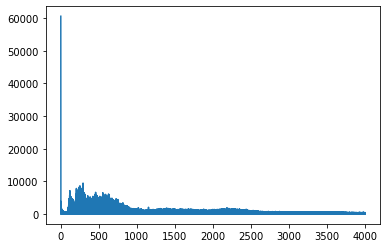

In [73]:
spectrum = wave.make_spectrum()
spectrum.plot()
pyplot.show()

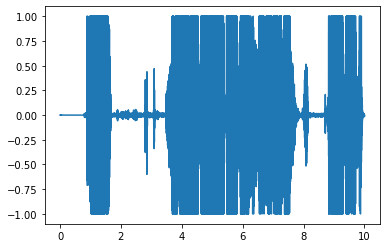

In [75]:
segment = wave.segment(start=0,duration = 10)
segment.plot()
pyplot.show()

# Play wave

In [60]:
from scipy.io import wavfile

In [62]:
def read_wave_with_scipy(filename):
    """Reads a wave file.

    filename: string

    returns: Wave
    """
    # TODO: Check back later and see if this works on 24-bit data,
    # and runs without throwing warnings.
    framerate, ys = wavfile.read(filename)

    # if it's in stereo, just pull out the first channel
    if ys.ndim == 2:
        ys = ys[:, 0]

    # ts = np.arange(len(ys)) / framerate
    wave = Wave(ys, framerate=framerate)
    wave.normalize()
    return wave


def play_wave(filename="sound.wav", player="aplay"):
    """Plays a wave file.

    filename: string
    player: string name of executable that plays wav files
    """
    cmd = "%s %s" % (player, filename)
    popen = subprocess.Popen(cmd, shell=True)
    popen.communicate()


def find_index(x, xs):
    """Find the index corresponding to a given value in an array."""
    n = len(xs)
    start = xs[0]
    end = xs[-1]
    i = round((n - 1) * (x - start) / (end - start))
    return int(i)

In [63]:
read_wave_with_scipy(audio_text_path[0][0])

NameError: ignored